In [2]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

# Use the kagglehub client library to attach Kaggle resources like competitions, datasets, and models to your session
# Learn more about kagglehub: https://github.com/Kaggle/kagglehub/blob/main/README.md

import kagglehub
# kagglehub.dataset_download('<owner>/<dataset-slug>')

/kaggle/input/datasets/user67/covid19-xray-aims/COVID_19_dataset/val/Normal/Normal-290.png
/kaggle/input/datasets/user67/covid19-xray-aims/COVID_19_dataset/val/Normal/Normal-3320.png
/kaggle/input/datasets/user67/covid19-xray-aims/COVID_19_dataset/val/Normal/Normal-5824.png
/kaggle/input/datasets/user67/covid19-xray-aims/COVID_19_dataset/val/Normal/Normal-9791.png
/kaggle/input/datasets/user67/covid19-xray-aims/COVID_19_dataset/val/Normal/Normal-4015.png
/kaggle/input/datasets/user67/covid19-xray-aims/COVID_19_dataset/val/Normal/Normal-9329.png
/kaggle/input/datasets/user67/covid19-xray-aims/COVID_19_dataset/val/Normal/Normal-3488.png
/kaggle/input/datasets/user67/covid19-xray-aims/COVID_19_dataset/val/Normal/Normal-8198.png
/kaggle/input/datasets/user67/covid19-xray-aims/COVID_19_dataset/val/Normal/Normal-686.png
/kaggle/input/datasets/user67/covid19-xray-aims/COVID_19_dataset/val/Normal/Normal-2678.png
/kaggle/input/datasets/user67/covid19-xray-aims/COVID_19_dataset/val/Normal/Normal

In [2]:
import os
for root, dirs, files in os.walk("/kaggle/input/datasets/user67/covid19-xray-aims"):
    level = root.replace("/kaggle/input/datasets/user67/covid19-xray-aims", "").count(os.sep)
    if level < 3:
        print(root)

/kaggle/input/datasets/user67/covid19-xray-aims
/kaggle/input/datasets/user67/covid19-xray-aims/COVID_19_dataset
/kaggle/input/datasets/user67/covid19-xray-aims/COVID_19_dataset/val
/kaggle/input/datasets/user67/covid19-xray-aims/COVID_19_dataset/test
/kaggle/input/datasets/user67/covid19-xray-aims/COVID_19_dataset/train


In [3]:
!pip install timm -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.2/12.2 MB 95.6 MB/s eta 0:00:00:00:0100:01
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
dask-cuda 26.2.0 requires cuda-core==0.3.*, but you have cuda-core 1.0.1 which is incompatible.
dask-cuda 26.2.0 requires numba-cuda<0.23.0,>=0.22.1, but you have numba-cuda 0.30.2 which is incompatible.
distributed-ucxx-cu12 0.48.0 requires numba-cuda[cu12]<0.23.0,>=0.22.1, but you have numba-cuda 0.30.2 which is incompatible.
cuml-cu12 26.2.0 requires numba<0.62.0,>=0.60.0, but you have numba 0.65.1 which is incompatible.
cuml-cu12 26.2.0 requires numba-cuda[cu12]<0.23.0,>=0.22.1, but you have numba-cuda 0.30.2 which is incompatible.
ucxx-cu12 0.48.0 requires numba-cuda[cu12]<0.23.0,>=0.22.1, but you have numba-cuda 0.30.2 which is incompatible.
cudf-cu12 26.2.1 requires numba<0.62.0,>=0.60.0, but you have numba 0.65.1 whic

In [4]:
import os
import json
import numpy as np
import matplotlib.pyplot as plt
from collections import Counter

import torch
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
from torchvision.utils import make_grid

DATASET_ROOT  = "/kaggle/input/datasets/user67/covid19-xray-aims/COVID_19_dataset"
OUTPUT_DIR    = "/kaggle/working/outputs"
IMAGE_SIZE    = 224
BATCH_SIZE    = 32
NUM_WORKERS   = 2
SEED          = 42
IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD  = [0.229, 0.224, 0.225]

torch.manual_seed(SEED)
os.makedirs(OUTPUT_DIR, exist_ok=True)

train_transforms = transforms.Compose([
    transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomRotation(degrees=10),
    transforms.ColorJitter(brightness=0.2, contrast=0.2),
    transforms.ToTensor(),
    transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
])

eval_transforms = transforms.Compose([
    transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
])

train_dataset = datasets.ImageFolder(root=os.path.join(DATASET_ROOT, "train"), transform=train_transforms)
val_dataset   = datasets.ImageFolder(root=os.path.join(DATASET_ROOT, "val"),   transform=eval_transforms)
test_dataset  = datasets.ImageFolder(root=os.path.join(DATASET_ROOT, "test"),  transform=eval_transforms)

CLASS_NAMES = train_dataset.classes
NUM_CLASSES = len(CLASS_NAMES)
print(f"Classes found: {CLASS_NAMES}")

def count_classes(dataset):
    counts = Counter(dataset.targets)
    return {CLASS_NAMES[k]: v for k, v in sorted(counts.items())}

train_counts = count_classes(train_dataset)
val_counts   = count_classes(val_dataset)
test_counts  = count_classes(test_dataset)

print(f"Train: {train_counts}")
print(f"Val:   {val_counts}")
print(f"Test:  {test_counts}")

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True,  num_workers=NUM_WORKERS, pin_memory=True)
val_loader   = DataLoader(val_dataset,   batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)
test_loader  = DataLoader(test_dataset,  batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)

print(f"Train batches: {len(train_loader)}")
print(f"Val batches:   {len(val_loader)}")
print(f"Test batches:  {len(test_loader)}")
print("Dataloaders ready.")

Classes found: ['COVID', 'Normal', 'Viral Pneumonia']
Train: {'COVID': 1000, 'Normal': 1000, 'Viral Pneumonia': 1000}
Val:   {'COVID': 200, 'Normal': 200, 'Viral Pneumonia': 200}
Test:  {'COVID': 145, 'Normal': 145, 'Viral Pneumonia': 145}
Train batches: 94
Val batches:   19
Test batches:  14
Dataloaders ready.


Using device: cuda
Downloading: "https://download.pytorch.org/models/efficientnet_b0_rwightman-7f5810bc.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b0_rwightman-7f5810bc.pth


100%|██████████| 20.5M/20.5M [00:00<00:00, 134MB/s] 


Training EfficientNet-B0 for up to 25 epochs | Early stopping patience: 5

Epoch 01/25 | Train Loss: 0.4870 Acc: 0.8287 | Val Loss: 0.1477 Acc: 0.9517 | 30.8s
  Saved best model (val loss: 0.1477)
Epoch 02/25 | Train Loss: 0.1847 Acc: 0.9323 | Val Loss: 0.0863 Acc: 0.9683 | 16.4s
  Saved best model (val loss: 0.0863)
Epoch 03/25 | Train Loss: 0.1208 Acc: 0.9570 | Val Loss: 0.0931 Acc: 0.9650 | 16.8s
  No improvement (1/5)
Epoch 04/25 | Train Loss: 0.0885 Acc: 0.9673 | Val Loss: 0.0681 Acc: 0.9750 | 16.8s
  Saved best model (val loss: 0.0681)
Epoch 05/25 | Train Loss: 0.0730 Acc: 0.9780 | Val Loss: 0.0871 Acc: 0.9733 | 16.9s
  No improvement (1/5)
Epoch 06/25 | Train Loss: 0.0669 Acc: 0.9817 | Val Loss: 0.0642 Acc: 0.9783 | 17.0s
  Saved best model (val loss: 0.0642)
Epoch 07/25 | Train Loss: 0.0482 Acc: 0.9830 | Val Loss: 0.0627 Acc: 0.9817 | 17.1s
  Saved best model (val loss: 0.0627)
Epoch 08/25 | Train Loss: 0.0458 Acc: 0.9857 | Val Loss: 0.0813 Acc: 0.9750 | 17.3s
  No improvement 

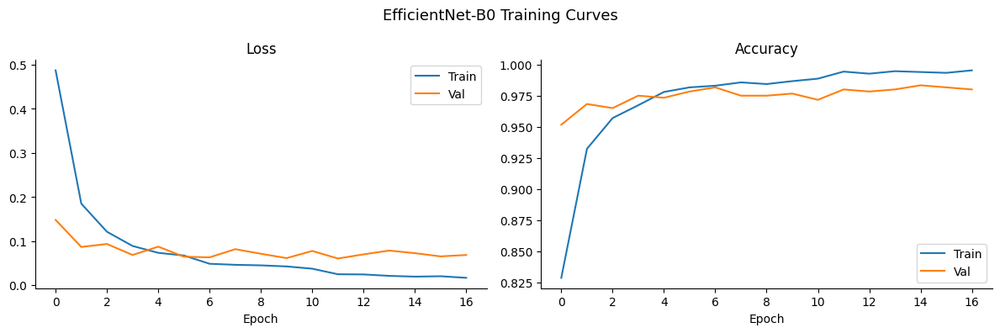


Test Accuracy: 0.9908
                 precision    recall  f1-score   support

          COVID       1.00      0.99      0.99       145
         Normal       0.98      0.99      0.99       145
Viral Pneumonia       0.99      0.99      0.99       145

       accuracy                           0.99       435
      macro avg       0.99      0.99      0.99       435
   weighted avg       0.99      0.99      0.99       435



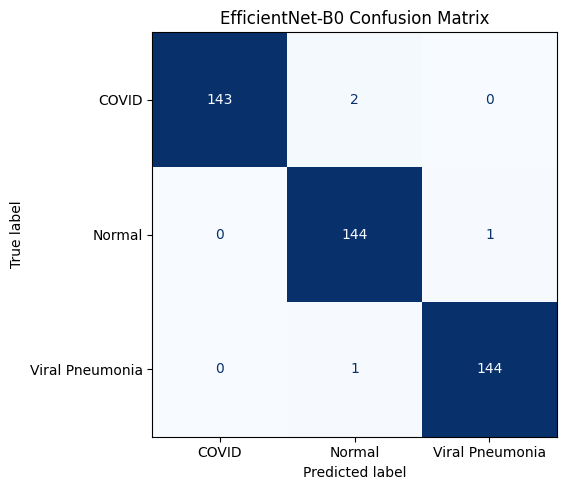

EfficientNet-B0 done.


In [5]:
import os
import json
import copy
import time
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
 
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim.lr_scheduler import CosineAnnealingLR
from torchvision import models
 
DEVICE     = torch.device("cuda" if torch.cuda.is_available() else "cpu")
OUTPUT_DIR = "/kaggle/working/outputs"
EPOCHS     = 25
LR         = 1e-4
PATIENCE   = 5
SEED       = 42
 
torch.manual_seed(SEED)
os.makedirs(OUTPUT_DIR, exist_ok=True)
print(f"Using device: {DEVICE}")
 
model = models.efficientnet_b0(weights=models.EfficientNet_B0_Weights.IMAGENET1K_V1)
model.classifier[1] = nn.Linear(model.classifier[1].in_features, NUM_CLASSES)
model = model.to(DEVICE)
 
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=LR)
scheduler = CosineAnnealingLR(optimizer, T_max=EPOCHS)
 
def train_one_epoch(model, loader):
    model.train()
    total_loss, correct, total = 0, 0, 0
    for images, labels in loader:
        images, labels = images.to(DEVICE), labels.to(DEVICE)
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        total_loss += loss.item() * images.size(0)
        correct    += (outputs.argmax(1) == labels).sum().item()
        total      += images.size(0)
    return total_loss / total, correct / total
 
def evaluate(model, loader):
    model.eval()
    total_loss, correct, total = 0, 0, 0
    all_preds, all_labels = [], []
    with torch.no_grad():
        for images, labels in loader:
            images, labels = images.to(DEVICE), labels.to(DEVICE)
            outputs = model(images)
            loss    = criterion(outputs, labels)
            total_loss += loss.item() * images.size(0)
            preds       = outputs.argmax(1)
            correct    += (preds == labels).sum().item()
            total      += images.size(0)
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
    return total_loss / total, correct / total, all_preds, all_labels
 
train_losses, val_losses = [], []
train_accs,   val_accs   = [], []
best_val_loss            = float("inf")
best_model_weights       = None
patience_counter         = 0
 
print(f"Training EfficientNet-B0 for up to {EPOCHS} epochs | Early stopping patience: {PATIENCE}\n")
 
for epoch in range(1, EPOCHS + 1):
    start = time.time()
    train_loss, train_acc   = train_one_epoch(model, train_loader)
    val_loss, val_acc, _, _ = evaluate(model, val_loader)
    scheduler.step()
 
    train_losses.append(train_loss)
    val_losses.append(val_loss)
    train_accs.append(train_acc)
    val_accs.append(val_acc)
 
    elapsed = time.time() - start
    print(f"Epoch {epoch:02d}/{EPOCHS} | Train Loss: {train_loss:.4f} Acc: {train_acc:.4f} | Val Loss: {val_loss:.4f} Acc: {val_acc:.4f} | {elapsed:.1f}s")
 
    if val_loss < best_val_loss:
        best_val_loss      = val_loss
        best_model_weights = copy.deepcopy(model.state_dict())
        patience_counter   = 0
        torch.save(best_model_weights, os.path.join(OUTPUT_DIR, "efficientnet_b0_best.pth"))
        print(f"  Saved best model (val loss: {best_val_loss:.4f})")
    else:
        patience_counter += 1
        print(f"  No improvement ({patience_counter}/{PATIENCE})")
        if patience_counter >= PATIENCE:
            print(f"\nEarly stopping at epoch {epoch}")
            break
 
model.load_state_dict(best_model_weights)
 
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].plot(train_losses, label="Train")
axes[0].plot(val_losses,   label="Val")
axes[0].set_title("Loss")
axes[0].set_xlabel("Epoch")
axes[0].legend()
axes[0].spines[["top", "right"]].set_visible(False)
axes[1].plot(train_accs, label="Train")
axes[1].plot(val_accs,   label="Val")
axes[1].set_title("Accuracy")
axes[1].set_xlabel("Epoch")
axes[1].legend()
axes[1].spines[["top", "right"]].set_visible(False)
plt.suptitle("EfficientNet-B0 Training Curves", fontsize=13)
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, "efficientnet_training_curves.png"), dpi=150, bbox_inches="tight")
plt.show()
 
_, test_acc, test_preds, test_labels = evaluate(model, test_loader)
print(f"\nTest Accuracy: {test_acc:.4f}")
print(classification_report(test_labels, test_preds, target_names=CLASS_NAMES))
 
cm = confusion_matrix(test_labels, test_preds)
fig, ax = plt.subplots(figsize=(6, 5))
ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=CLASS_NAMES).plot(ax=ax, colorbar=False, cmap="Blues")
ax.set_title("EfficientNet-B0 Confusion Matrix")
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, "efficientnet_confusion_matrix.png"), dpi=150, bbox_inches="tight")
plt.show()
 
report = classification_report(test_labels, test_preds, target_names=CLASS_NAMES, output_dict=True)
with open(os.path.join(OUTPUT_DIR, "efficientnet_results.json"), "w") as f:
    json.dump({"model": "EfficientNet-B0", "test_accuracy": round(test_acc, 4), "epochs_trained": len(train_losses), "best_val_loss": round(best_val_loss, 4), "classification_report": report}, f, indent=2)
 
print("EfficientNet-B0 done.")

model.safetensors:   0%|          | 0.00/88.2M [00:00<?, ?B/s]

Training DeiT-Small for up to 25 epochs | Early stopping patience: 5

Epoch 01/25 | Train Loss: 0.3002 Acc: 0.8710 | Val Loss: 0.1258 Acc: 0.9517 | 30.8s
  Saved best model (val loss: 0.1258)
Epoch 02/25 | Train Loss: 0.1256 Acc: 0.9527 | Val Loss: 0.1122 Acc: 0.9617 | 31.2s
  Saved best model (val loss: 0.1122)
Epoch 03/25 | Train Loss: 0.1124 Acc: 0.9563 | Val Loss: 0.1478 Acc: 0.9400 | 31.9s
  No improvement (1/5)
Epoch 04/25 | Train Loss: 0.0891 Acc: 0.9657 | Val Loss: 0.1953 Acc: 0.9217 | 32.2s
  No improvement (2/5)
Epoch 05/25 | Train Loss: 0.0671 Acc: 0.9750 | Val Loss: 0.0898 Acc: 0.9700 | 32.3s
  Saved best model (val loss: 0.0898)
Epoch 06/25 | Train Loss: 0.0392 Acc: 0.9850 | Val Loss: 0.0787 Acc: 0.9700 | 32.6s
  Saved best model (val loss: 0.0787)
Epoch 07/25 | Train Loss: 0.0441 Acc: 0.9830 | Val Loss: 0.2039 Acc: 0.9333 | 32.7s
  No improvement (1/5)
Epoch 08/25 | Train Loss: 0.0296 Acc: 0.9903 | Val Loss: 0.0776 Acc: 0.9733 | 33.0s
  Saved best model (val loss: 0.0776)

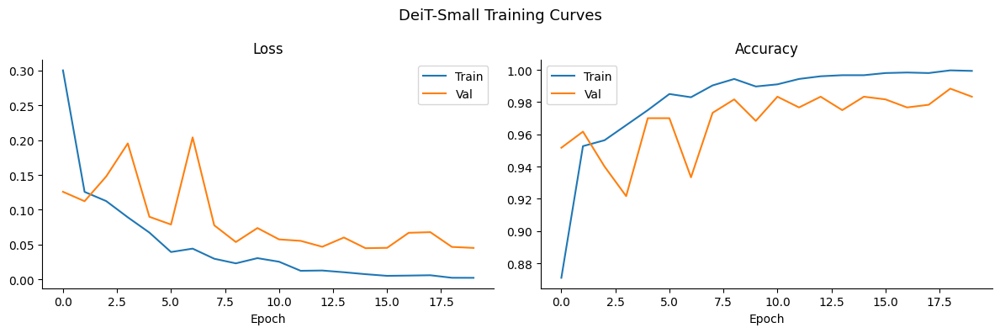


Test Accuracy: 0.9885
                 precision    recall  f1-score   support

          COVID       1.00      0.99      0.99       145
         Normal       0.98      0.99      0.99       145
Viral Pneumonia       0.99      0.99      0.99       145

       accuracy                           0.99       435
      macro avg       0.99      0.99      0.99       435
   weighted avg       0.99      0.99      0.99       435



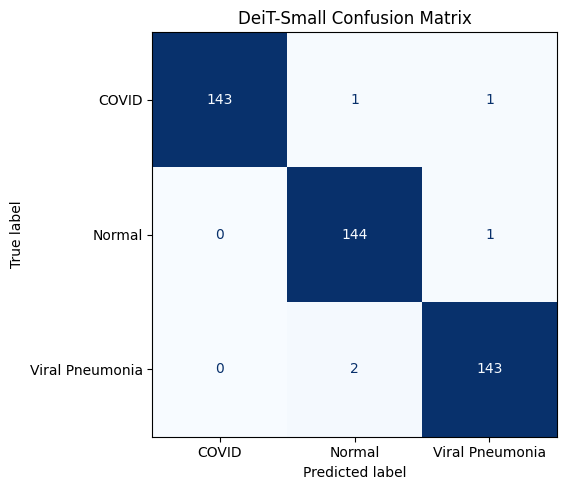

DeiT-Small done.


In [6]:
import copy
import time
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
import timm
 
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim.lr_scheduler import CosineAnnealingLR
 
EPOCHS   = 25
LR       = 5e-5
PATIENCE = 5
 
deit_model = timm.create_model("deit_small_patch16_224", pretrained=True, num_classes=NUM_CLASSES)
deit_model = deit_model.to(DEVICE)
 
deit_criterion = nn.CrossEntropyLoss()
deit_optimizer = optim.Adam(deit_model.parameters(), lr=LR)
deit_scheduler = CosineAnnealingLR(deit_optimizer, T_max=EPOCHS)
 
def train_one_epoch_deit(model, loader):
    model.train()
    total_loss, correct, total = 0, 0, 0
    for images, labels in loader:
        images, labels = images.to(DEVICE), labels.to(DEVICE)
        deit_optimizer.zero_grad()
        outputs = model(images)
        loss = deit_criterion(outputs, labels)
        loss.backward()
        deit_optimizer.step()
        total_loss += loss.item() * images.size(0)
        correct    += (outputs.argmax(1) == labels).sum().item()
        total      += images.size(0)
    return total_loss / total, correct / total
 
def evaluate_deit(model, loader):
    model.eval()
    total_loss, correct, total = 0, 0, 0
    all_preds, all_labels = [], []
    with torch.no_grad():
        for images, labels in loader:
            images, labels = images.to(DEVICE), labels.to(DEVICE)
            outputs = model(images)
            loss    = deit_criterion(outputs, labels)
            total_loss += loss.item() * images.size(0)
            preds       = outputs.argmax(1)
            correct    += (preds == labels).sum().item()
            total      += images.size(0)
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
    return total_loss / total, correct / total, all_preds, all_labels
 
train_losses_d, val_losses_d = [], []
train_accs_d,   val_accs_d   = [], []
best_val_loss_d              = float("inf")
best_weights_d               = None
patience_counter_d           = 0
 
print(f"Training DeiT-Small for up to {EPOCHS} epochs | Early stopping patience: {PATIENCE}\n")
 
for epoch in range(1, EPOCHS + 1):
    start = time.time()
    train_loss, train_acc   = train_one_epoch_deit(deit_model, train_loader)
    val_loss, val_acc, _, _ = evaluate_deit(deit_model, val_loader)
    deit_scheduler.step()
 
    train_losses_d.append(train_loss)
    val_losses_d.append(val_loss)
    train_accs_d.append(train_acc)
    val_accs_d.append(val_acc)
 
    elapsed = time.time() - start
    print(f"Epoch {epoch:02d}/{EPOCHS} | Train Loss: {train_loss:.4f} Acc: {train_acc:.4f} | Val Loss: {val_loss:.4f} Acc: {val_acc:.4f} | {elapsed:.1f}s")
 
    if val_loss < best_val_loss_d:
        best_val_loss_d  = val_loss
        best_weights_d   = copy.deepcopy(deit_model.state_dict())
        patience_counter_d = 0
        torch.save(best_weights_d, os.path.join(OUTPUT_DIR, "deit_small_best.pth"))
        print(f"  Saved best model (val loss: {best_val_loss_d:.4f})")
    else:
        patience_counter_d += 1
        print(f"  No improvement ({patience_counter_d}/{PATIENCE})")
        if patience_counter_d >= PATIENCE:
            print(f"\nEarly stopping at epoch {epoch}")
            break
 
deit_model.load_state_dict(best_weights_d)
 
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].plot(train_losses_d, label="Train")
axes[0].plot(val_losses_d,   label="Val")
axes[0].set_title("Loss")
axes[0].set_xlabel("Epoch")
axes[0].legend()
axes[0].spines[["top", "right"]].set_visible(False)
axes[1].plot(train_accs_d, label="Train")
axes[1].plot(val_accs_d,   label="Val")
axes[1].set_title("Accuracy")
axes[1].set_xlabel("Epoch")
axes[1].legend()
axes[1].spines[["top", "right"]].set_visible(False)
plt.suptitle("DeiT-Small Training Curves", fontsize=13)
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, "deit_training_curves.png"), dpi=150, bbox_inches="tight")
plt.show()
 
_, test_acc_d, test_preds_d, test_labels_d = evaluate_deit(deit_model, test_loader)
print(f"\nTest Accuracy: {test_acc_d:.4f}")
print(classification_report(test_labels_d, test_preds_d, target_names=CLASS_NAMES))
 
cm = confusion_matrix(test_labels_d, test_preds_d)
fig, ax = plt.subplots(figsize=(6, 5))
ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=CLASS_NAMES).plot(ax=ax, colorbar=False, cmap="Blues")
ax.set_title("DeiT-Small Confusion Matrix")
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, "deit_confusion_matrix.png"), dpi=150, bbox_inches="tight")
plt.show()
 
report_d = classification_report(test_labels_d, test_preds_d, target_names=CLASS_NAMES, output_dict=True)
with open(os.path.join(OUTPUT_DIR, "deit_results.json"), "w") as f:
    json.dump({"model": "DeiT-Small", "test_accuracy": round(test_acc_d, 4), "epochs_trained": len(train_losses_d), "best_val_loss": round(best_val_loss_d, 4), "classification_report": report_d}, f, indent=2)
 
print("DeiT-Small done.")

In [7]:
!pip install grad-cam -q

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 52.4 MB/s eta 0:00:0000:0100:01
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done


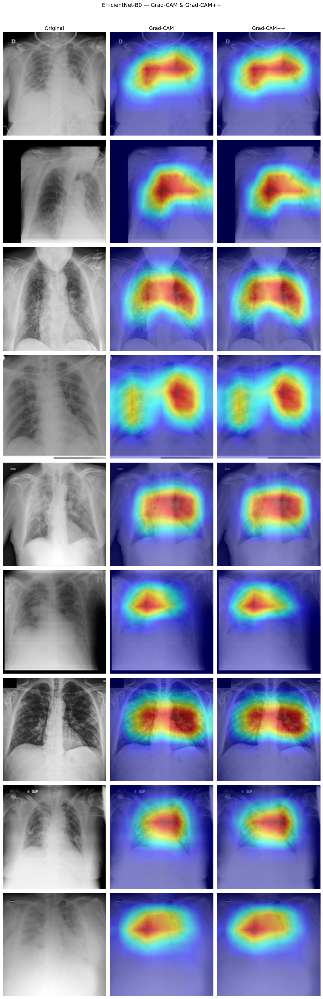

Saved: efficientnet_gradcam.png
Grad-CAM maps computed for 32 test images.
Phase 3 EfficientNet done.


In [8]:
import os
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
from torchvision import models
from pytorch_grad_cam import GradCAM, GradCAMPlusPlus
from pytorch_grad_cam.utils.image import show_cam_on_image
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
 
DEVICE     = torch.device("cuda" if torch.cuda.is_available() else "cpu")
OUTPUT_DIR = "/kaggle/working/outputs"
os.makedirs(OUTPUT_DIR, exist_ok=True)
 
efficientnet = models.efficientnet_b0(weights=None)
efficientnet.classifier[1] = nn.Linear(efficientnet.classifier[1].in_features, NUM_CLASSES)
efficientnet.load_state_dict(torch.load(os.path.join(OUTPUT_DIR, "efficientnet_b0_best.pth"), map_location=DEVICE))
efficientnet = efficientnet.to(DEVICE)
efficientnet.eval()
 
target_layer = [efficientnet.features[-1]]
 
def denormalize(tensor):
    mean = torch.tensor([0.485, 0.456, 0.406]).view(3,1,1)
    std  = torch.tensor([0.229, 0.224, 0.225]).view(3,1,1)
    return (tensor * std + mean).clamp(0, 1)
 
images_batch, labels_batch = next(iter(test_loader))
images_batch = images_batch.to(DEVICE)
 
num_images = 9
fig, axes  = plt.subplots(num_images, 3, figsize=(12, num_images * 4))
col_titles = ["Original", "Grad-CAM", "Grad-CAM++"]
for col, title in enumerate(col_titles):
    axes[0][col].set_title(title, fontsize=13, fontweight="500")
 
for idx in range(num_images):
    img_tensor = images_batch[idx].unsqueeze(0)
    label      = labels_batch[idx].item()
    rgb_img    = denormalize(images_batch[idx].cpu()).permute(1, 2, 0).numpy()
 
    with GradCAM(model=efficientnet, target_layers=target_layer) as cam:
        grayscale_cam     = cam(input_tensor=img_tensor, targets=[ClassifierOutputTarget(label)])
        gradcam_overlay   = show_cam_on_image(rgb_img, grayscale_cam[0], use_rgb=True)
 
    with GradCAMPlusPlus(model=efficientnet, target_layers=target_layer) as cam:
        grayscale_cam_pp  = cam(input_tensor=img_tensor, targets=[ClassifierOutputTarget(label)])
        gradcampp_overlay = show_cam_on_image(rgb_img, grayscale_cam_pp[0], use_rgb=True)
 
    axes[idx][0].imshow(rgb_img)
    axes[idx][0].set_ylabel(CLASS_NAMES[label], fontsize=10)
    axes[idx][1].imshow(gradcam_overlay)
    axes[idx][2].imshow(gradcampp_overlay)
 
    for ax in axes[idx]:
        ax.axis("off")
 
plt.suptitle("EfficientNet-B0 — Grad-CAM & Grad-CAM++", fontsize=14, y=1.01)
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, "efficientnet_gradcam.png"), dpi=150, bbox_inches="tight")
plt.show()
print("Saved: efficientnet_gradcam.png")
 
gradcam_maps = []
for idx in range(len(images_batch)):
    img_tensor = images_batch[idx].unsqueeze(0)
    label      = labels_batch[idx].item()
    with GradCAM(model=efficientnet, target_layers=target_layer) as cam:
        grayscale_cam = cam(input_tensor=img_tensor, targets=[ClassifierOutputTarget(label)])
    gradcam_maps.append((grayscale_cam[0], label))
 
print(f"Grad-CAM maps computed for {len(gradcam_maps)} test images.")
print("Phase 3 EfficientNet done.")

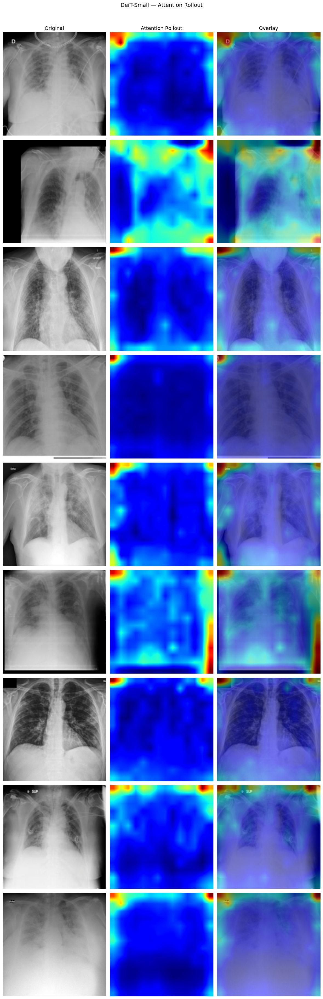

Saved: deit_attention_rollout.png
Attention Rollout maps computed for 9 images.
Phase 3 DeiT done.


In [9]:
import os
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import timm
import cv2

DEVICE     = torch.device("cuda" if torch.cuda.is_available() else "cpu")
OUTPUT_DIR = "/kaggle/working/outputs"
os.makedirs(OUTPUT_DIR, exist_ok=True)

deit = timm.create_model("deit_small_patch16_224", pretrained=False, num_classes=NUM_CLASSES)
deit.load_state_dict(torch.load(os.path.join(OUTPUT_DIR, "deit_small_best.pth"), map_location=DEVICE))
deit = deit.to(DEVICE)
deit.eval()

def attention_rollout(model, img_tensor):
    attentions = []

    hooks = []
    for block in model.blocks:
        def hook_fn(module, input, output, storage=attentions):
            with torch.no_grad():
                qkv    = module.qkv(input[0])
                B, N, _ = input[0].shape
                C      = module.qkv.out_features // 3
                num_heads = module.num_heads
                head_dim  = C // num_heads
                qkv    = qkv.reshape(B, N, 3, num_heads, head_dim).permute(2, 0, 3, 1, 4)
                q, k   = qkv[0], qkv[1]
                scale  = head_dim ** -0.5
                attn   = (q @ k.transpose(-2, -1)) * scale
                attn   = attn.softmax(dim=-1)
                storage.append(attn.mean(dim=1).detach().cpu())
        hooks.append(block.attn.register_forward_hook(hook_fn))

    with torch.no_grad():
        _ = model(img_tensor)

    for h in hooks:
        h.remove()

    result = torch.eye(attentions[0].shape[-1])
    for attn in attentions:
        attn_fused = attn[0]
        attn_fused = attn_fused + torch.eye(attn_fused.shape[-1])
        attn_fused = attn_fused / attn_fused.sum(dim=-1, keepdim=True)
        result     = attn_fused @ result

    cls_attn = result[0, 1:]
    num_patches = int(cls_attn.shape[0] ** 0.5)
    cls_attn = cls_attn.reshape(num_patches, num_patches).numpy()
    cls_attn = (cls_attn - cls_attn.min()) / (cls_attn.max() - cls_attn.min() + 1e-8)
    cls_attn = cv2.resize(cls_attn, (224, 224))
    return cls_attn

def denormalize(tensor):
    mean = torch.tensor([0.485, 0.456, 0.406]).view(3,1,1)
    std  = torch.tensor([0.229, 0.224, 0.225]).view(3,1,1)
    return (tensor * std + mean).clamp(0, 1)

images_batch, labels_batch = next(iter(test_loader))
images_batch = images_batch.to(DEVICE)

num_images = 9
fig, axes  = plt.subplots(num_images, 3, figsize=(12, num_images * 4))
col_titles = ["Original", "Attention Rollout", "Overlay"]
for col, title in enumerate(col_titles):
    axes[0][col].set_title(title, fontsize=13, fontweight="500")

rollout_maps = []
for idx in range(num_images):
    img_tensor = images_batch[idx].unsqueeze(0)
    label      = labels_batch[idx].item()
    rgb_img    = denormalize(images_batch[idx].cpu()).permute(1, 2, 0).numpy()

    attn_map   = attention_rollout(deit, img_tensor)

    heatmap    = cv2.applyColorMap(np.uint8(255 * attn_map), cv2.COLORMAP_JET)
    heatmap    = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB) / 255.0
    overlay    = (0.5 * rgb_img + 0.5 * heatmap).clip(0, 1)

    axes[idx][0].imshow(rgb_img)
    axes[idx][0].set_ylabel(CLASS_NAMES[label], fontsize=10)
    axes[idx][1].imshow(attn_map, cmap="jet")
    axes[idx][2].imshow(overlay)

    for ax in axes[idx]:
        ax.axis("off")

    rollout_maps.append((attn_map, label))

plt.suptitle("DeiT-Small — Attention Rollout", fontsize=14, y=1.01)
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, "deit_attention_rollout.png"), dpi=150, bbox_inches="tight")
plt.show()
print("Saved: deit_attention_rollout.png")
print(f"Attention Rollout maps computed for {len(rollout_maps)} images.")
print("Phase 3 DeiT done.")

In [10]:
!pip install grad-cam -q

Evaluating on 50 test images...

  Processed 10/50
  Processed 20/50
  Processed 30/50
  Processed 40/50
  Processed 50/50


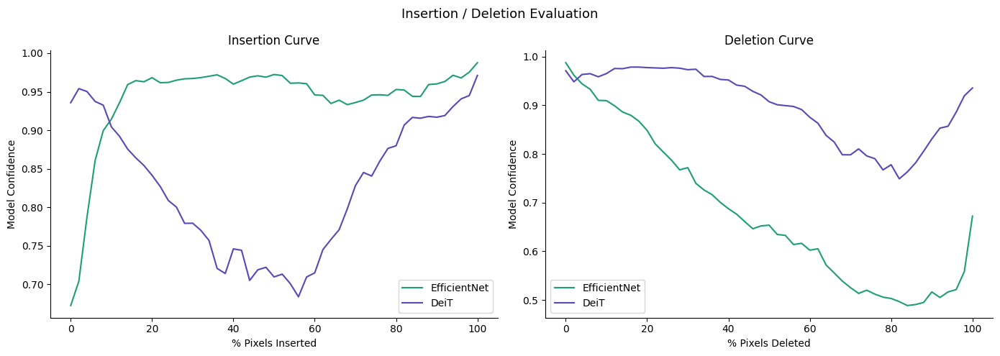

Saved: insertion_deletion_curves.png

========= Phase 4 Results =========
Metric                       EfficientNet            DeiT
-------------------------------------------------------
AOPC (higher=better)               0.3102          0.0714
Entropy (lower=better)            10.1081         10.6176
AUC Insertion                      0.9429          0.8259
AUC Deletion                       0.6744          0.8987

Saved: phase4_results.json
Phase 4 complete.


In [11]:
import os
import json
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import models
import timm
import cv2
from scipy.stats import entropy as scipy_entropy
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
 
DEVICE     = torch.device("cuda" if torch.cuda.is_available() else "cpu")
OUTPUT_DIR = "/kaggle/working/outputs"
NUM_EVAL   = 50
 
os.makedirs(OUTPUT_DIR, exist_ok=True)
 
efficientnet = models.efficientnet_b0(weights=None)
efficientnet.classifier[1] = nn.Linear(efficientnet.classifier[1].in_features, NUM_CLASSES)
efficientnet.load_state_dict(torch.load(os.path.join(OUTPUT_DIR, "efficientnet_b0_best.pth"), map_location=DEVICE))
efficientnet = efficientnet.to(DEVICE)
efficientnet.eval()
 
deit = timm.create_model("deit_small_patch16_224", pretrained=False, num_classes=NUM_CLASSES)
deit.load_state_dict(torch.load(os.path.join(OUTPUT_DIR, "deit_small_best.pth"), map_location=DEVICE))
deit = deit.to(DEVICE)
deit.eval()
 
def denormalize(tensor):
    mean = torch.tensor([0.485, 0.456, 0.406]).view(3,1,1)
    std  = torch.tensor([0.229, 0.224, 0.225]).view(3,1,1)
    return (tensor * std + mean).clamp(0, 1)
 
def get_gradcam_map(model, img_tensor, label):
    target_layer = [model.features[-1]]
    with GradCAM(model=model, target_layers=target_layer) as cam:
        saliency = cam(input_tensor=img_tensor, targets=[ClassifierOutputTarget(label)])
    return saliency[0]
 
def get_attention_rollout_map(model, img_tensor):
    attentions = []
    hooks = []
    for block in model.blocks:
        def hook_fn(module, input, output, storage=attentions):
            with torch.no_grad():
                qkv       = module.qkv(input[0])
                B, N, _   = input[0].shape
                C         = module.qkv.out_features // 3
                num_heads = module.num_heads
                head_dim  = C // num_heads
                qkv       = qkv.reshape(B, N, 3, num_heads, head_dim).permute(2, 0, 3, 1, 4)
                q, k      = qkv[0], qkv[1]
                attn      = (q @ k.transpose(-2, -1)) * (head_dim ** -0.5)
                attn      = attn.softmax(dim=-1)
                storage.append(attn.mean(dim=1).detach().cpu())
        hooks.append(block.attn.register_forward_hook(hook_fn))
    with torch.no_grad():
        _ = model(img_tensor)
    for h in hooks:
        h.remove()
    result = torch.eye(attentions[0].shape[-1])
    for attn in attentions:
        attn_fused = attn[0] + torch.eye(attn[0].shape[-1])
        attn_fused = attn_fused / attn_fused.sum(dim=-1, keepdim=True)
        result     = attn_fused @ result
    cls_attn    = result[0, 1:].numpy()
    num_patches = int(cls_attn.shape[0] ** 0.5)
    cls_attn    = cls_attn.reshape(num_patches, num_patches)
    cls_attn    = (cls_attn - cls_attn.min()) / (cls_attn.max() - cls_attn.min() + 1e-8)
    cls_attn    = cv2.resize(cls_attn, (224, 224))
    return cls_attn
 
def insertion_deletion_scores(model, img_tensor, saliency_map, label, steps=50):
    img_np      = img_tensor.squeeze(0).cpu()
    blurred     = F.avg_pool2d(img_tensor, kernel_size=51, stride=1, padding=25)
    flat_idx    = np.argsort(saliency_map.flatten())[::-1]
    h, w        = saliency_map.shape
    total_pixels = h * w
 
    insertion_scores = []
    deletion_scores  = []
 
    for step in range(steps + 1):
        num_pixels  = int((step / steps) * total_pixels)
        mask        = np.zeros(total_pixels, dtype=np.float32)
        if num_pixels > 0:
            mask[flat_idx[:num_pixels]] = 1.0
        mask        = torch.tensor(mask.reshape(1, h, w)).to(DEVICE)
 
        ins_img     = blurred * (1 - mask) + img_tensor * mask
        del_img     = img_tensor * (1 - mask) + blurred * mask
 
        with torch.no_grad():
            ins_conf = F.softmax(model(ins_img), dim=1)[0, label].item()
            del_conf = F.softmax(model(del_img), dim=1)[0, label].item()
 
        insertion_scores.append(ins_conf)
        deletion_scores.append(del_conf)
 
    return np.array(insertion_scores), np.array(deletion_scores)
 
def compute_aopc(deletion_scores):
    baseline = deletion_scores[0]
    drops    = baseline - np.array(deletion_scores)
    return float(np.mean(drops))
 
def compute_entropy(saliency_map):
    flat = saliency_map.flatten()
    flat = flat / (flat.sum() + 1e-8)
    return float(scipy_entropy(flat + 1e-8))
 
all_images, all_labels = [], []
for images, labels in test_loader:
    all_images.append(images)
    all_labels.append(labels)
    if sum(len(l) for l in all_labels) >= NUM_EVAL:
        break
all_images = torch.cat(all_images)[:NUM_EVAL].to(DEVICE)
all_labels = torch.cat(all_labels)[:NUM_EVAL]
 
print(f"Evaluating on {NUM_EVAL} test images...\n")
 
results = {
    "EfficientNet": {"insertion": [], "deletion": [], "aopc": [], "entropy": []},
    "DeiT":         {"insertion": [], "deletion": [], "aopc": [], "entropy": []},
}
 
for idx in range(NUM_EVAL):
    img_tensor = all_images[idx].unsqueeze(0)
    label      = all_labels[idx].item()
 
    eff_map  = get_gradcam_map(efficientnet, img_tensor, label)
    ins_e, del_e = insertion_deletion_scores(efficientnet, img_tensor, eff_map, label)
    results["EfficientNet"]["insertion"].append(ins_e)
    results["EfficientNet"]["deletion"].append(del_e)
    results["EfficientNet"]["aopc"].append(compute_aopc(del_e))
    results["EfficientNet"]["entropy"].append(compute_entropy(eff_map))
 
    deit_map = get_attention_rollout_map(deit, img_tensor)
    ins_d, del_d = insertion_deletion_scores(deit, img_tensor, deit_map, label)
    results["DeiT"]["insertion"].append(ins_d)
    results["DeiT"]["deletion"].append(del_d)
    results["DeiT"]["aopc"].append(compute_aopc(del_d))
    results["DeiT"]["entropy"].append(compute_entropy(deit_map))
 
    if (idx + 1) % 10 == 0:
        print(f"  Processed {idx+1}/{NUM_EVAL}")
 
mean_ins_e = np.mean(results["EfficientNet"]["insertion"], axis=0)
mean_del_e = np.mean(results["EfficientNet"]["deletion"],  axis=0)
mean_ins_d = np.mean(results["DeiT"]["insertion"],         axis=0)
mean_del_d = np.mean(results["DeiT"]["deletion"],          axis=0)
x_axis     = np.linspace(0, 100, 51)
 
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
 
axes[0].plot(x_axis, mean_ins_e, label="EfficientNet", color="#1D9E75")
axes[0].plot(x_axis, mean_ins_d, label="DeiT",         color="#534AB7")
axes[0].set_title("Insertion Curve")
axes[0].set_xlabel("% Pixels Inserted")
axes[0].set_ylabel("Model Confidence")
axes[0].legend()
axes[0].spines[["top", "right"]].set_visible(False)
 
axes[1].plot(x_axis, mean_del_e, label="EfficientNet", color="#1D9E75")
axes[1].plot(x_axis, mean_del_d, label="DeiT",         color="#534AB7")
axes[1].set_title("Deletion Curve")
axes[1].set_xlabel("% Pixels Deleted")
axes[1].set_ylabel("Model Confidence")
axes[1].legend()
axes[1].spines[["top", "right"]].set_visible(False)
 
plt.suptitle("Insertion / Deletion Evaluation", fontsize=13)
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, "insertion_deletion_curves.png"), dpi=150, bbox_inches="tight")
plt.show()
print("Saved: insertion_deletion_curves.png")
 
aopc_e    = np.mean(results["EfficientNet"]["aopc"])
aopc_d    = np.mean(results["DeiT"]["aopc"])
entropy_e = np.mean(results["EfficientNet"]["entropy"])
entropy_d = np.mean(results["DeiT"]["entropy"])
auc_ins_e = float(np.trapezoid(mean_ins_e, x_axis) / 100)
auc_ins_d = float(np.trapezoid(mean_ins_d, x_axis) / 100)
auc_del_e = float(np.trapezoid(mean_del_e, x_axis) / 100)
auc_del_d = float(np.trapezoid(mean_del_d, x_axis) / 100)
 
print("\n========= Phase 4 Results =========")
print(f"{'Metric':<25} {'EfficientNet':>15} {'DeiT':>15}")
print("-" * 55)
print(f"{'AOPC (higher=better)':<25} {aopc_e:>15.4f} {aopc_d:>15.4f}")
print(f"{'Entropy (lower=better)':<25} {entropy_e:>15.4f} {entropy_d:>15.4f}")
print(f"{'AUC Insertion':<25} {auc_ins_e:>15.4f} {auc_ins_d:>15.4f}")
print(f"{'AUC Deletion':<25} {auc_del_e:>15.4f} {auc_del_d:>15.4f}")
print("=" * 55)
 
summary = {
    "EfficientNet": {"aopc": round(aopc_e, 4), "entropy": round(entropy_e, 4), "auc_insertion": round(auc_ins_e, 4), "auc_deletion": round(auc_del_e, 4)},
    "DeiT":         {"aopc": round(aopc_d, 4), "entropy": round(entropy_d, 4), "auc_insertion": round(auc_ins_d, 4), "auc_deletion": round(auc_del_d, 4)},
}
with open(os.path.join(OUTPUT_DIR, "phase4_results.json"), "w") as f:
    json.dump(summary, f, indent=2)
print("\nSaved: phase4_results.json")
print("Phase 4 complete.")

In [12]:
!pip install lime -q

Evaluating on 30 images



  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  5/30 done


  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  10/30 done


  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  15/30 done


  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  20/30 done


  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  25/30 done


  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  30/30 done

========= Bonus Task Results =========
Method                         BSS    Mean AOPC   Std AOPC   Del Corr
-------------------------------------------------------------------
EfficientNet_GradCAM       25.8263       0.4105     0.0329    -0.7530
EfficientNet_GradCAMpp     17.3751       0.3904     0.0349    -0.7315
EfficientNet_LIME          10.5585       0.3886     0.0493    -0.5931
DeiT_Rollout                6.4405       0.2868     0.0584    -0.5114


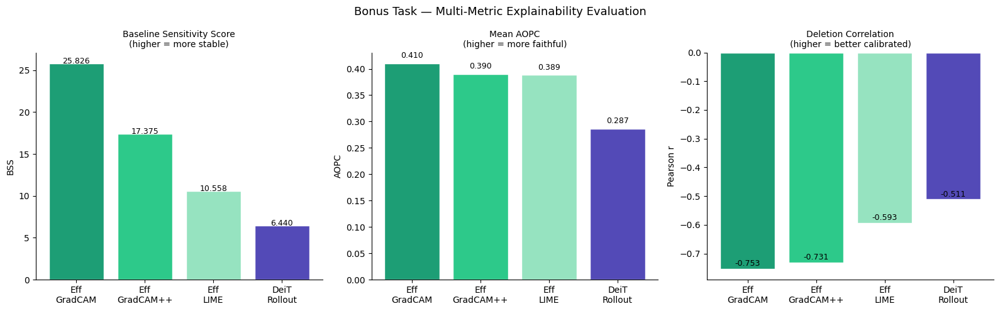

Saved: bonus_metrics_comparison.png


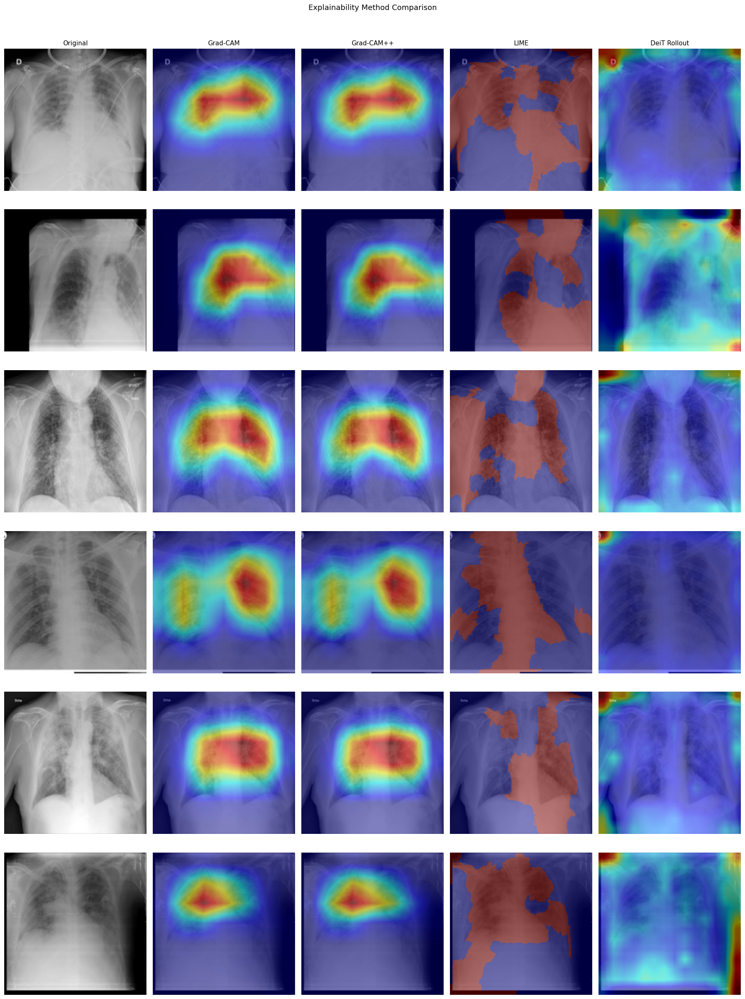

Saved: bonus_method_comparison.png
Saved: bonus_results.json

Bonus Task complete.


In [13]:
!pip install lime -q
 
import os
import json
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import models, transforms
import timm
import cv2
from PIL import Image
from scipy.stats import pearsonr
from lime import lime_image
from skimage.segmentation import mark_boundaries
from pytorch_grad_cam import GradCAM, GradCAMPlusPlus
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image
 
DEVICE        = torch.device("cuda" if torch.cuda.is_available() else "cpu")
OUTPUT_DIR    = "/kaggle/working/outputs"
DATASET_ROOT  = "/kaggle/input/datasets/user67/covid19-xray-aims/COVID_19_dataset"
NUM_EVAL      = 30
TOP_K         = 0.1
IMAGE_SIZE    = 224
IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD  = [0.229, 0.224, 0.225]
 
os.makedirs(OUTPUT_DIR, exist_ok=True)
 
efficientnet = models.efficientnet_b0(weights=None)
efficientnet.classifier[1] = nn.Linear(efficientnet.classifier[1].in_features, NUM_CLASSES)
efficientnet.load_state_dict(torch.load(os.path.join(OUTPUT_DIR, "efficientnet_b0_best.pth"), map_location=DEVICE))
efficientnet = efficientnet.to(DEVICE)
efficientnet.eval()
 
deit = timm.create_model("deit_small_patch16_224", pretrained=False, num_classes=NUM_CLASSES)
deit.load_state_dict(torch.load(os.path.join(OUTPUT_DIR, "deit_small_best.pth"), map_location=DEVICE))
deit = deit.to(DEVICE)
deit.eval()
 
eval_transforms = transforms.Compose([
    transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
])
 
def denormalize(tensor):
    mean = torch.tensor(IMAGENET_MEAN).view(3,1,1)
    std  = torch.tensor(IMAGENET_STD).view(3,1,1)
    return (tensor * std + mean).clamp(0, 1)
 
def get_gradcam_map(model, img_tensor, label):
    with GradCAM(model=model, target_layers=[model.features[-1]]) as cam:
        return cam(input_tensor=img_tensor, targets=[ClassifierOutputTarget(label)])[0]
 
def get_gradcampp_map(model, img_tensor, label):
    with GradCAMPlusPlus(model=model, target_layers=[model.features[-1]]) as cam:
        return cam(input_tensor=img_tensor, targets=[ClassifierOutputTarget(label)])[0]
 
def get_lime_map(model, rgb_np, label):
    def predict_fn(images):
        batch = []
        for img in images:
            t = transforms.Compose([
                transforms.ToTensor(),
                transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
            ])(Image.fromarray((img * 255).astype(np.uint8)))
            batch.append(t)
        batch = torch.stack(batch).to(DEVICE)
        with torch.no_grad():
            return F.softmax(model(batch), dim=1).cpu().numpy()
 
    explainer    = lime_image.LimeImageExplainer()
    explanation  = explainer.explain_instance(
        rgb_np.astype(np.float64),
        predict_fn,
        top_labels=NUM_CLASSES,
        hide_color=0,
        num_samples=200,
    )
    _, mask = explanation.get_image_and_mask(label, positive_only=True, num_features=10, hide_rest=False)
    lime_map = mask.astype(np.float32)
    if lime_map.max() > 0:
        lime_map = lime_map / lime_map.max()
    return lime_map
 
def get_attention_rollout_map(model, img_tensor):
    attentions = []
    hooks = []
    for block in model.blocks:
        def hook_fn(module, input, output, storage=attentions):
            with torch.no_grad():
                qkv       = module.qkv(input[0])
                B, N, _   = input[0].shape
                C         = module.qkv.out_features // 3
                num_heads = module.num_heads
                head_dim  = C // num_heads
                qkv       = qkv.reshape(B, N, 3, num_heads, head_dim).permute(2, 0, 3, 1, 4)
                q, k      = qkv[0], qkv[1]
                attn      = (q @ k.transpose(-2, -1)) * (head_dim ** -0.5)
                attn      = attn.softmax(dim=-1)
                storage.append(attn.mean(dim=1).detach().cpu())
        hooks.append(block.attn.register_forward_hook(hook_fn))
    with torch.no_grad():
        _ = model(img_tensor)
    for h in hooks:
        h.remove()
    result = torch.eye(attentions[0].shape[-1])
    for attn in attentions:
        attn_fused = attn[0] + torch.eye(attn[0].shape[-1])
        attn_fused = attn_fused / attn_fused.sum(dim=-1, keepdim=True)
        result     = attn_fused @ result
    cls_attn    = result[0, 1:].numpy()
    num_patches = int(cls_attn.shape[0] ** 0.5)
    cls_attn    = cls_attn.reshape(num_patches, num_patches)
    cls_attn    = (cls_attn - cls_attn.min()) / (cls_attn.max() - cls_attn.min() + 1e-8)
    return cv2.resize(cls_attn, (IMAGE_SIZE, IMAGE_SIZE))
 
def perturb_image(img_tensor, mask_flat, top_idx, num_pixels, baseline):
    mask        = np.zeros(len(mask_flat), dtype=np.float32)
    if num_pixels > 0:
        mask[top_idx[:num_pixels]] = 1.0
    mask_t      = torch.tensor(mask.reshape(1, IMAGE_SIZE, IMAGE_SIZE)).to(DEVICE)
    return img_tensor * (1 - mask_t) + baseline * mask_t
 
def compute_aopc_with_baseline(model, img_tensor, saliency_map, label, baseline, steps=20):
    flat_idx  = np.argsort(saliency_map.flatten())[::-1]
    total_px  = IMAGE_SIZE * IMAGE_SIZE
    scores    = []
    with torch.no_grad():
        orig_conf = F.softmax(model(img_tensor), dim=1)[0, label].item()
    for step in range(steps + 1):
        n_px     = int((step / steps) * total_px)
        del_img  = perturb_image(img_tensor, saliency_map.flatten(), flat_idx, n_px, baseline)
        with torch.no_grad():
            conf = F.softmax(model(del_img), dim=1)[0, label].item()
        scores.append(orig_conf - conf)
    return float(np.mean(scores))
 
def baseline_sensitivity_score(model, img_tensor, saliency_map, label):
    blur_base   = F.avg_pool2d(img_tensor, kernel_size=51, stride=1, padding=25)
    black_base  = torch.zeros_like(img_tensor)
    noise_base  = torch.randn_like(img_tensor) * 0.1
    aopc_blur   = compute_aopc_with_baseline(model, img_tensor, saliency_map, label, blur_base)
    aopc_black  = compute_aopc_with_baseline(model, img_tensor, saliency_map, label, black_base)
    aopc_noise  = compute_aopc_with_baseline(model, img_tensor, saliency_map, label, noise_base)
    mean_aopc   = np.mean([aopc_blur, aopc_black, aopc_noise])
    std_aopc    = np.std([aopc_blur,  aopc_black, aopc_noise])
    bss         = mean_aopc / (std_aopc + 1e-8)
    return float(bss), float(mean_aopc), float(std_aopc)
 
def deletion_correlation(model, img_tensor, saliency_map, label, steps=20):
    flat_sal  = saliency_map.flatten()
    flat_idx  = np.argsort(flat_sal)[::-1]
    total_px  = IMAGE_SIZE * IMAGE_SIZE
    blur_base = F.avg_pool2d(img_tensor, kernel_size=51, stride=1, padding=25)
    sal_vals, conf_drops = [], []
    with torch.no_grad():
        orig_conf = F.softmax(model(img_tensor), dim=1)[0, label].item()
    for step in range(1, steps + 1):
        n_px    = int((step / steps) * total_px)
        idx_now = flat_idx[n_px - int(total_px / steps): n_px]
        sal_vals.append(float(flat_sal[idx_now].mean()))
        del_img = perturb_image(img_tensor, flat_sal, flat_idx, n_px, blur_base)
        with torch.no_grad():
            conf = F.softmax(model(del_img), dim=1)[0, label].item()
        conf_drops.append(orig_conf - conf)
    corr, _ = pearsonr(sal_vals, conf_drops)
    return float(corr)
 
img_paths, img_labels = [], []
for class_idx, class_name in enumerate(CLASS_NAMES):
    class_dir = os.path.join(DATASET_ROOT, "test", class_name)
    for fname in sorted(os.listdir(class_dir))[:10]:
        if fname.lower().endswith((".png", ".jpg", ".jpeg")):
            img_paths.append(os.path.join(class_dir, fname))
            img_labels.append(class_idx)
img_paths  = img_paths[:NUM_EVAL]
img_labels = img_labels[:NUM_EVAL]
print(f"Evaluating on {len(img_paths)} images\n")
 
results = {
    "EfficientNet_GradCAM":   {"bss": [], "mean_aopc": [], "std_aopc": [], "dc": []},
    "EfficientNet_GradCAMpp": {"bss": [], "mean_aopc": [], "std_aopc": [], "dc": []},
    "EfficientNet_LIME":      {"bss": [], "mean_aopc": [], "std_aopc": [], "dc": []},
    "DeiT_Rollout":           {"bss": [], "mean_aopc": [], "std_aopc": [], "dc": []},
}
vis_data = []
 
for idx, (img_path, label) in enumerate(zip(img_paths, img_labels)):
    pil_img    = Image.open(img_path).convert("RGB")
    img_tensor = eval_transforms(pil_img).unsqueeze(0).to(DEVICE)
    rgb_np     = denormalize(img_tensor.squeeze(0).cpu()).permute(1,2,0).numpy()
 
    eff_gc   = get_gradcam_map(efficientnet,   img_tensor, label)
    eff_gcpp = get_gradcampp_map(efficientnet, img_tensor, label)
    eff_lime = get_lime_map(efficientnet, rgb_np, label)
    deit_ro  = get_attention_rollout_map(deit, img_tensor)
 
    for key, model_, smap in [
        ("EfficientNet_GradCAM",   efficientnet, eff_gc),
        ("EfficientNet_GradCAMpp", efficientnet, eff_gcpp),
        ("EfficientNet_LIME",      efficientnet, eff_lime),
        ("DeiT_Rollout",           deit,         deit_ro),
    ]:
        bss, m_aopc, s_aopc = baseline_sensitivity_score(model_, img_tensor, smap, label)
        dc                  = deletion_correlation(model_, img_tensor, smap, label)
        results[key]["bss"].append(bss)
        results[key]["mean_aopc"].append(m_aopc)
        results[key]["std_aopc"].append(s_aopc)
        results[key]["dc"].append(dc)
 
    if len(vis_data) < 6:
        vis_data.append((rgb_np, eff_gc, eff_gcpp, eff_lime, deit_ro, CLASS_NAMES[label]))
 
    if (idx + 1) % 5 == 0:
        print(f"  {idx+1}/{len(img_paths)} done")
 
print("\n========= Bonus Task Results =========")
print(f"{'Method':<25} {'BSS':>8} {'Mean AOPC':>12} {'Std AOPC':>10} {'Del Corr':>10}")
print("-" * 67)
for key, vals in results.items():
    print(f"{key:<25} {np.mean(vals['bss']):>8.4f} {np.mean(vals['mean_aopc']):>12.4f} "
          f"{np.mean(vals['std_aopc']):>10.4f} {np.mean(vals['dc']):>10.4f}")
print("=" * 67)
 
methods     = list(results.keys())
bss_vals    = [np.mean(results[m]["bss"])       for m in methods]
aopc_vals   = [np.mean(results[m]["mean_aopc"]) for m in methods]
std_vals    = [np.mean(results[m]["std_aopc"])  for m in methods]
dc_vals     = [np.mean(results[m]["dc"])        for m in methods]
colors      = ["#1D9E75", "#2DC98A", "#96E3C0", "#534AB7"]
short_names = ["Eff\nGradCAM", "Eff\nGradCAM++", "Eff\nLIME", "DeiT\nRollout"]
 
fig, axes = plt.subplots(1, 3, figsize=(16, 5))
for ax, vals, title, ylabel in zip(axes,
    [bss_vals, aopc_vals, dc_vals],
    ["Baseline Sensitivity Score\n(higher = more stable)", "Mean AOPC\n(higher = more faithful)", "Deletion Correlation\n(higher = better calibrated)"],
    ["BSS", "AOPC", "Pearson r"],
):
    bars = ax.bar(short_names, vals, color=colors, edgecolor="white")
    ax.set_title(title, fontsize=10)
    ax.set_ylabel(ylabel)
    for bar, v in zip(bars, vals):
        ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.01, f"{v:.3f}", ha="center", fontsize=9)
    ax.spines[["top", "right"]].set_visible(False)
 
plt.suptitle("Bonus Task — Multi-Metric Explainability Evaluation", fontsize=13)
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, "bonus_metrics_comparison.png"), dpi=150, bbox_inches="tight")
plt.show()
print("Saved: bonus_metrics_comparison.png")
 
fig, axes = plt.subplots(len(vis_data), 5, figsize=(18, len(vis_data) * 4))
col_titles = ["Original", "Grad-CAM", "Grad-CAM++", "LIME", "DeiT Rollout"]
for col, title in enumerate(col_titles):
    axes[0][col].set_title(title, fontsize=11, fontweight="500")
 
for row, (rgb_np, gc, gcpp, lime_m, ro, class_name) in enumerate(vis_data):
    axes[row][0].imshow(rgb_np)
    axes[row][0].set_ylabel(class_name, fontsize=9)
 
    for col, smap in enumerate([gc, gcpp, lime_m, ro], start=1):
        heatmap = cv2.applyColorMap(np.uint8(255 * smap), cv2.COLORMAP_JET)
        heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB) / 255.0
        overlay = (0.5 * rgb_np + 0.5 * heatmap).clip(0, 1)
        axes[row][col].imshow(overlay)
 
    for ax in axes[row]:
        ax.axis("off")
 
plt.suptitle("Explainability Method Comparison", fontsize=13, y=1.01)
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, "bonus_method_comparison.png"), dpi=150, bbox_inches="tight")
plt.show()
print("Saved: bonus_method_comparison.png")
 
summary = {}
for key, vals in results.items():
    summary[key] = {
        "bss":       round(float(np.mean(vals["bss"])),       4),
        "mean_aopc": round(float(np.mean(vals["mean_aopc"])), 4),
        "std_aopc":  round(float(np.mean(vals["std_aopc"])),  4),
        "dc":        round(float(np.mean(vals["dc"])),        4),
    }
with open(os.path.join(OUTPUT_DIR, "bonus_results.json"), "w") as f:
    json.dump(summary, f, indent=2)
print("Saved: bonus_results.json")
print("\nBonus Task complete.")

Using device: cuda


model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

Training ViT-B/16 for up to 25 epochs | Patience: 5

Epoch 01/25 | Train Loss: 0.4303 Acc: 0.8067 | Val Loss: 0.1785 Acc: 0.9250 | 98.9s
  Saved best model (val loss: 0.1785)
Epoch 02/25 | Train Loss: 0.1502 Acc: 0.9430 | Val Loss: 0.0885 Acc: 0.9700 | 104.1s
  Saved best model (val loss: 0.0885)
Epoch 03/25 | Train Loss: 0.0895 Acc: 0.9633 | Val Loss: 0.0906 Acc: 0.9650 | 106.1s
  No improvement (1/5)
Epoch 04/25 | Train Loss: 0.0716 Acc: 0.9760 | Val Loss: 0.1595 Acc: 0.9483 | 107.6s
  No improvement (2/5)
Epoch 05/25 | Train Loss: 0.0515 Acc: 0.9813 | Val Loss: 0.1146 Acc: 0.9567 | 108.4s
  No improvement (3/5)
Epoch 06/25 | Train Loss: 0.0955 Acc: 0.9653 | Val Loss: 0.0847 Acc: 0.9683 | 108.2s
  Saved best model (val loss: 0.0847)
Epoch 07/25 | Train Loss: 0.0325 Acc: 0.9907 | Val Loss: 0.1040 Acc: 0.9733 | 108.0s
  No improvement (1/5)
Epoch 08/25 | Train Loss: 0.0296 Acc: 0.9860 | Val Loss: 0.0676 Acc: 0.9800 | 108.1s
  Saved best model (val loss: 0.0676)
Epoch 09/25 | Train Loss

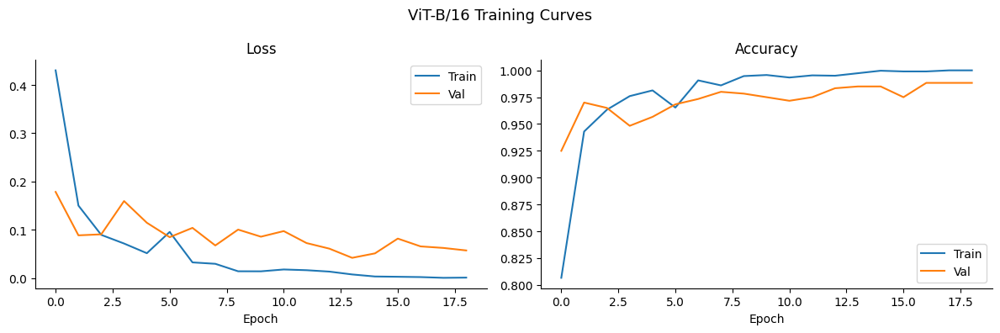


Test Accuracy: 0.9977
                 precision    recall  f1-score   support

          COVID       1.00      1.00      1.00       145
         Normal       1.00      0.99      1.00       145
Viral Pneumonia       0.99      1.00      1.00       145

       accuracy                           1.00       435
      macro avg       1.00      1.00      1.00       435
   weighted avg       1.00      1.00      1.00       435



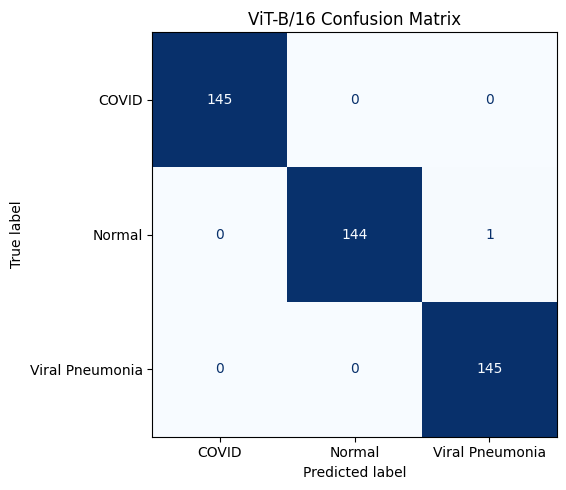

Saved: vit_results.json
ViT-B/16 training complete.


In [14]:
import os
import json
import copy
import time
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay

import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim.lr_scheduler import CosineAnnealingLR
import timm

DEVICE     = torch.device("cuda" if torch.cuda.is_available() else "cpu")
OUTPUT_DIR = "/kaggle/working/outputs"
EPOCHS     = 25
LR         = 2e-5
PATIENCE   = 5
SEED       = 42

os.makedirs(OUTPUT_DIR, exist_ok=True)
torch.manual_seed(SEED)
print(f"Using device: {DEVICE}")

model = timm.create_model("vit_base_patch16_224", pretrained=True, num_classes=NUM_CLASSES)
model = model.to(DEVICE)

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=LR)
scheduler = CosineAnnealingLR(optimizer, T_max=EPOCHS)

def train_one_epoch(model, loader):
    model.train()
    total_loss, correct, total = 0, 0, 0
    for images, labels in loader:
        images, labels = images.to(DEVICE), labels.to(DEVICE)
        optimizer.zero_grad()
        outputs = model(images)
        loss    = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        total_loss += loss.item() * images.size(0)
        correct    += (outputs.argmax(1) == labels).sum().item()
        total      += images.size(0)
    return total_loss / total, correct / total

def evaluate(model, loader):
    model.eval()
    total_loss, correct, total = 0, 0, 0
    all_preds, all_labels = [], []
    with torch.no_grad():
        for images, labels in loader:
            images, labels = images.to(DEVICE), labels.to(DEVICE)
            outputs = model(images)
            loss    = criterion(outputs, labels)
            total_loss += loss.item() * images.size(0)
            preds       = outputs.argmax(1)
            correct    += (preds == labels).sum().item()
            total      += images.size(0)
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
    return total_loss / total, correct / total, all_preds, all_labels

train_losses, val_losses = [], []
train_accs,   val_accs   = [], []
best_val_loss            = float("inf")
best_model_weights       = None
patience_counter         = 0

print(f"Training ViT-B/16 for up to {EPOCHS} epochs | Patience: {PATIENCE}\n")

for epoch in range(1, EPOCHS + 1):
    start = time.time()
    train_loss, train_acc   = train_one_epoch(model, train_loader)
    val_loss, val_acc, _, _ = evaluate(model, val_loader)
    scheduler.step()

    train_losses.append(train_loss)
    val_losses.append(val_loss)
    train_accs.append(train_acc)
    val_accs.append(val_acc)

    elapsed = time.time() - start
    print(f"Epoch {epoch:02d}/{EPOCHS} | Train Loss: {train_loss:.4f} Acc: {train_acc:.4f} | Val Loss: {val_loss:.4f} Acc: {val_acc:.4f} | {elapsed:.1f}s")

    if val_loss < best_val_loss:
        best_val_loss      = val_loss
        best_model_weights = copy.deepcopy(model.state_dict())
        patience_counter   = 0
        torch.save(best_model_weights, os.path.join(OUTPUT_DIR, "vit_b16_best.pth"))
        print(f"  Saved best model (val loss: {best_val_loss:.4f})")
    else:
        patience_counter += 1
        print(f"  No improvement ({patience_counter}/{PATIENCE})")
        if patience_counter >= PATIENCE:
            print(f"\nEarly stopping at epoch {epoch}")
            break

model.load_state_dict(best_model_weights)

fig, axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].plot(train_losses, label="Train")
axes[0].plot(val_losses,   label="Val")
axes[0].set_title("Loss")
axes[0].set_xlabel("Epoch")
axes[0].legend()
axes[0].spines[["top", "right"]].set_visible(False)
axes[1].plot(train_accs, label="Train")
axes[1].plot(val_accs,   label="Val")
axes[1].set_title("Accuracy")
axes[1].set_xlabel("Epoch")
axes[1].legend()
axes[1].spines[["top", "right"]].set_visible(False)
plt.suptitle("ViT-B/16 Training Curves", fontsize=13)
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, "vit_training_curves.png"), dpi=150, bbox_inches="tight")
plt.show()

_, test_acc, test_preds, test_labels = evaluate(model, test_loader)
print(f"\nTest Accuracy: {test_acc:.4f}")
print(classification_report(test_labels, test_preds, target_names=CLASS_NAMES))

cm = confusion_matrix(test_labels, test_preds)
fig, ax = plt.subplots(figsize=(6, 5))
ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=CLASS_NAMES).plot(ax=ax, colorbar=False, cmap="Blues")
ax.set_title("ViT-B/16 Confusion Matrix")
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, "vit_confusion_matrix.png"), dpi=150, bbox_inches="tight")
plt.show()

report = classification_report(test_labels, test_preds, target_names=CLASS_NAMES, output_dict=True)
with open(os.path.join(OUTPUT_DIR, "vit_results.json"), "w") as f:
    json.dump({"model": "ViT-B/16", "test_accuracy": round(test_acc, 4), "epochs_trained": len(train_losses), "best_val_loss": round(best_val_loss, 4), "classification_report": report}, f, indent=2)

print(f"Saved: vit_results.json")
print("ViT-B/16 training complete.")

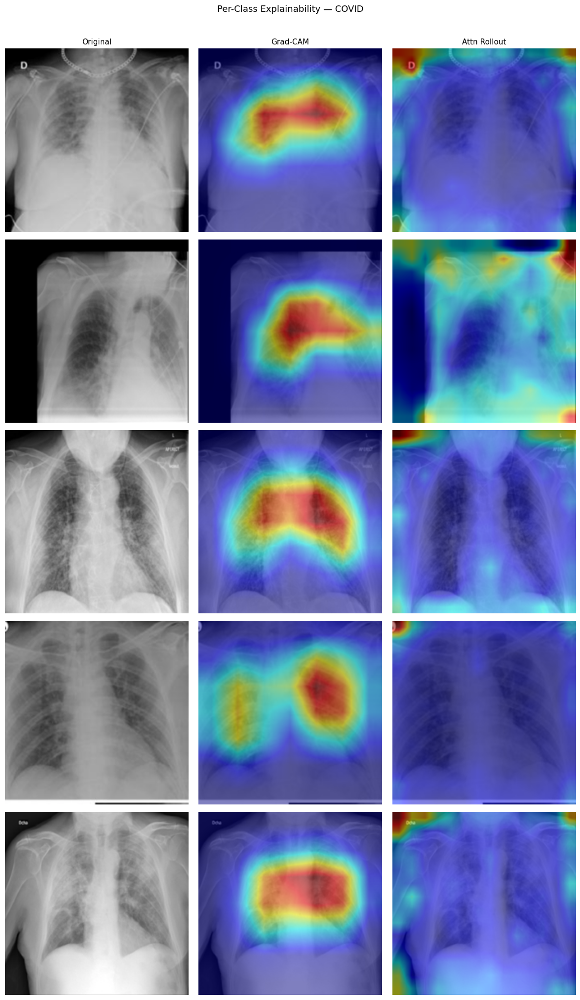

Saved: /kaggle/working/outputs/perclass_COVID.png


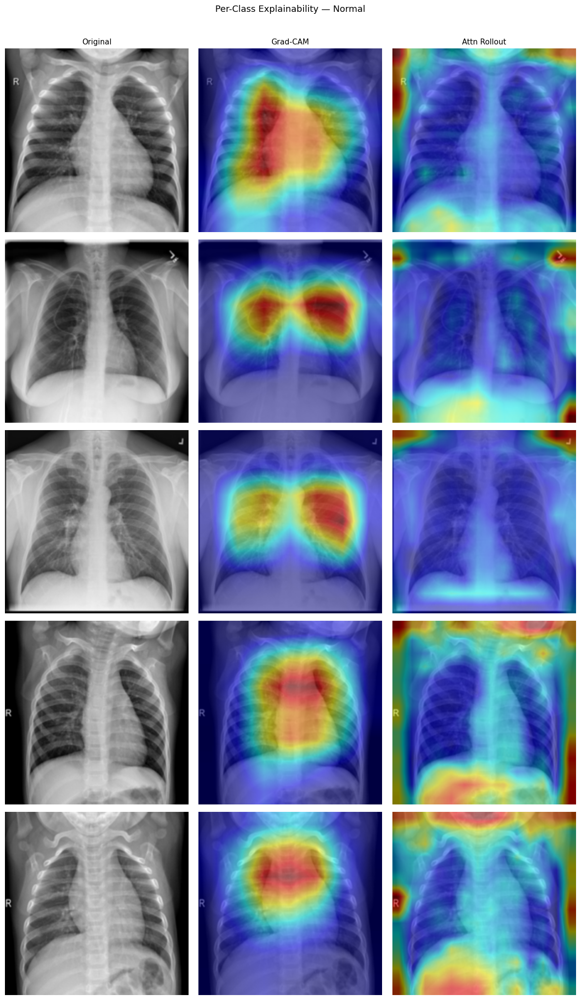

Saved: /kaggle/working/outputs/perclass_Normal.png


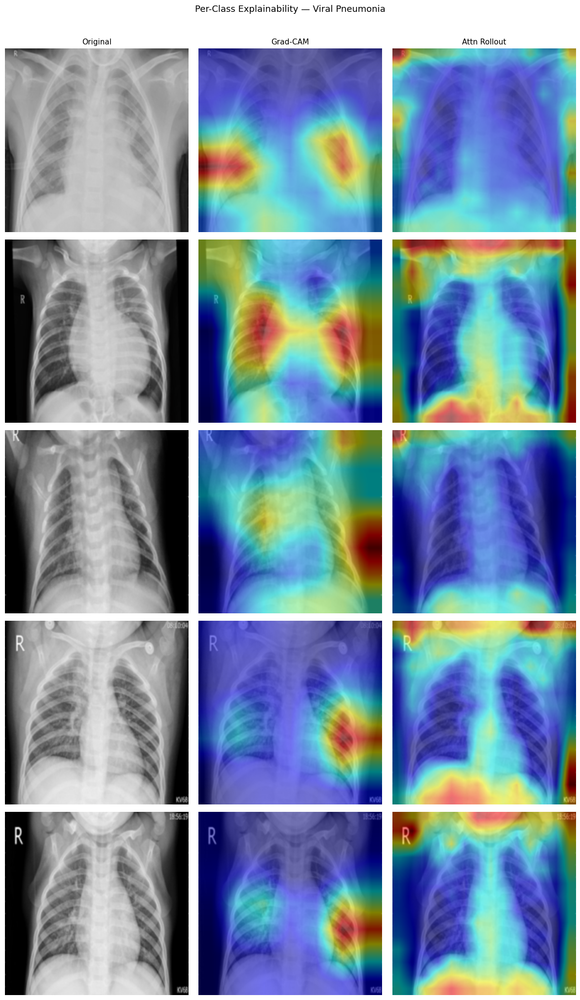

Saved: /kaggle/working/outputs/perclass_Viral_Pneumonia.png

Per-class explainability complete.
Key things to look for in the images:
  COVID     — Grad-CAM should focus on bilateral lung infiltrates / ground glass opacities
  Normal    — Grad-CAM should be more diffuse, no specific focus on pathology
  Viral Pnm — Grad-CAM should focus on consolidation regions, may differ from COVID pattern


In [15]:
import os
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import models, transforms
import timm
import cv2
from PIL import Image
from pytorch_grad_cam import GradCAM, GradCAMPlusPlus
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
 
DEVICE        = torch.device("cuda" if torch.cuda.is_available() else "cpu")
OUTPUT_DIR    = "/kaggle/working/outputs"
DATASET_ROOT  = "/kaggle/input/datasets/user67/covid19-xray-aims/COVID_19_dataset"
IMAGE_SIZE    = 224
IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD  = [0.229, 0.224, 0.225]
IMAGES_PER_CLASS = 5
 
os.makedirs(OUTPUT_DIR, exist_ok=True)
 
efficientnet = models.efficientnet_b0(weights=None)
efficientnet.classifier[1] = nn.Linear(efficientnet.classifier[1].in_features, NUM_CLASSES)
efficientnet.load_state_dict(torch.load(os.path.join(OUTPUT_DIR, "efficientnet_b0_best.pth"), map_location=DEVICE))
efficientnet = efficientnet.to(DEVICE)
efficientnet.eval()
 
deit = timm.create_model("deit_small_patch16_224", pretrained=False, num_classes=NUM_CLASSES)
deit.load_state_dict(torch.load(os.path.join(OUTPUT_DIR, "deit_small_best.pth"), map_location=DEVICE))
deit = deit.to(DEVICE)
deit.eval()
 
eval_transforms = transforms.Compose([
    transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
])
 
def denormalize(tensor):
    mean = torch.tensor(IMAGENET_MEAN).view(3,1,1)
    std  = torch.tensor(IMAGENET_STD).view(3,1,1)
    return (tensor * std + mean).clamp(0, 1)
 
def get_gradcam_map(model, img_tensor, label):
    with GradCAM(model=model, target_layers=[model.features[-1]]) as cam:
        return cam(input_tensor=img_tensor, targets=[ClassifierOutputTarget(label)])[0]
 
def get_attention_rollout(model, img_tensor):
    attentions = []
    hooks = []
    for block in model.blocks:
        def hook_fn(module, input, output, storage=attentions):
            with torch.no_grad():
                qkv       = module.qkv(input[0])
                B, N, _   = input[0].shape
                C         = module.qkv.out_features // 3
                num_heads = module.num_heads
                head_dim  = C // num_heads
                qkv       = qkv.reshape(B, N, 3, num_heads, head_dim).permute(2, 0, 3, 1, 4)
                q, k      = qkv[0], qkv[1]
                attn      = (q @ k.transpose(-2, -1)) * (head_dim ** -0.5)
                attn      = attn.softmax(dim=-1)
                storage.append(attn.mean(dim=1).detach().cpu())
        hooks.append(block.attn.register_forward_hook(hook_fn))
    with torch.no_grad():
        _ = model(img_tensor)
    for h in hooks:
        h.remove()
    result = torch.eye(attentions[0].shape[-1])
    for attn in attentions:
        attn_fused = attn[0] + torch.eye(attn[0].shape[-1])
        attn_fused = attn_fused / attn_fused.sum(dim=-1, keepdim=True)
        result     = attn_fused @ result
    cls_attn    = result[0, 1:].numpy()
    num_patches = int(cls_attn.shape[0] ** 0.5)
    cls_attn    = cls_attn.reshape(num_patches, num_patches)
    cls_attn    = (cls_attn - cls_attn.min()) / (cls_attn.max() - cls_attn.min() + 1e-8)
    return cv2.resize(cls_attn, (IMAGE_SIZE, IMAGE_SIZE))
 
def overlay_heatmap(rgb_np, smap):
    heatmap = cv2.applyColorMap(np.uint8(255 * smap), cv2.COLORMAP_JET)
    heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB) / 255.0
    return (0.5 * rgb_np + 0.5 * heatmap).clip(0, 1)
 
for class_idx, class_name in enumerate(CLASS_NAMES):
    class_dir  = os.path.join(DATASET_ROOT, "test", class_name)
    img_files  = sorted([f for f in os.listdir(class_dir) if f.lower().endswith((".png",".jpg",".jpeg"))])[:IMAGES_PER_CLASS]
 
    fig, axes = plt.subplots(IMAGES_PER_CLASS, 3, figsize=(12, IMAGES_PER_CLASS * 4))
    if IMAGES_PER_CLASS == 1:
        axes = [axes]
    axes[0][0].set_title("Original",     fontsize=11, fontweight="500")
    axes[0][1].set_title("Grad-CAM",     fontsize=11, fontweight="500")
    axes[0][2].set_title("Attn Rollout", fontsize=11, fontweight="500")
 
    for row, fname in enumerate(img_files):
        img_path   = os.path.join(class_dir, fname)
        pil_img    = Image.open(img_path).convert("RGB")
        img_tensor = eval_transforms(pil_img).unsqueeze(0).to(DEVICE)
        rgb_np     = denormalize(img_tensor.squeeze(0).cpu()).permute(1,2,0).numpy()
 
        gc_map   = get_gradcam_map(efficientnet, img_tensor, class_idx)
        ro_map   = get_attention_rollout(deit, img_tensor)
 
        axes[row][0].imshow(rgb_np)
        axes[row][0].set_ylabel(fname[:15], fontsize=7)
        axes[row][1].imshow(overlay_heatmap(rgb_np, gc_map))
        axes[row][2].imshow(overlay_heatmap(rgb_np, ro_map))
        for ax in axes[row]:
            ax.axis("off")
 
    plt.suptitle(f"Per-Class Explainability — {class_name}", fontsize=13, y=1.01)
    plt.tight_layout()
    out_path = os.path.join(OUTPUT_DIR, f"perclass_{class_name.replace(' ','_')}.png")
    plt.savefig(out_path, dpi=150, bbox_inches="tight")
    plt.show()
    print(f"Saved: {out_path}")
 
print("\nPer-class explainability complete.")
print("Key things to look for in the images:")
print("  COVID     — Grad-CAM should focus on bilateral lung infiltrates / ground glass opacities")
print("  Normal    — Grad-CAM should be more diffuse, no specific focus on pathology")
print("  Viral Pnm — Grad-CAM should focus on consolidation regions, may differ from COVID pattern")

In [1]:
!pip install shap -q

import os
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import models, transforms
import shap
import cv2
from PIL import Image

DEVICE        = torch.device("cuda" if torch.cuda.is_available() else "cpu")
OUTPUT_DIR    = "/kaggle/working/outputs"
DATASET_ROOT  = "/kaggle/input/datasets/user67/covid19-xray-aims/COVID_19_dataset"
IMAGE_SIZE    = 224
IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD  = [0.229, 0.224, 0.225]
NUM_BACKGROUND = 20
NUM_EXPLAIN    = 6

os.makedirs(OUTPUT_DIR, exist_ok=True)

efficientnet = models.efficientnet_b0(weights=None)
efficientnet.classifier[1] = nn.Linear(efficientnet.classifier[1].in_features, NUM_CLASSES)
efficientnet.load_state_dict(torch.load(os.path.join(OUTPUT_DIR, "efficientnet_b0_best.pth"), map_location=DEVICE))
efficientnet = efficientnet.to(DEVICE)
efficientnet.eval()

eval_transforms = transforms.Compose([
    transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
])

def denormalize(tensor):
    mean = torch.tensor(IMAGENET_MEAN).view(3,1,1)
    std  = torch.tensor(IMAGENET_STD).view(3,1,1)
    return (tensor * std + mean).clamp(0, 1)

bg_images, explain_images, explain_labels = [], [], []
for class_idx, class_name in enumerate(CLASS_NAMES):
    class_dir = os.path.join(DATASET_ROOT, "test", class_name)
    files     = sorted([f for f in os.listdir(class_dir) if f.lower().endswith((".png",".jpg",".jpeg"))])
    for fname in files[:7]:
        pil_img    = Image.open(os.path.join(class_dir, fname)).convert("RGB")
        img_tensor = eval_transforms(pil_img)
        bg_images.append(img_tensor)
    for fname in files[7:9]:
        pil_img    = Image.open(os.path.join(class_dir, fname)).convert("RGB")
        img_tensor = eval_transforms(pil_img)
        explain_images.append(img_tensor)
        explain_labels.append(class_idx)

bg_tensor      = torch.stack(bg_images[:NUM_BACKGROUND]).to(DEVICE)
explain_tensor = torch.stack(explain_images[:NUM_EXPLAIN]).to(DEVICE)

print("Running SHAP DeepExplainer...")
explainer   = shap.DeepExplainer(efficientnet, bg_tensor)
shap_values = explainer.shap_values(explain_tensor)
print("SHAP values computed.")

fig, axes = plt.subplots(NUM_EXPLAIN, 3, figsize=(12, NUM_EXPLAIN * 4))
axes[0][0].set_title("Original",        fontsize=11, fontweight="500")
axes[0][1].set_title("SHAP (positive)",  fontsize=11, fontweight="500")
axes[0][2].set_title("SHAP (absolute)",  fontsize=11, fontweight="500")

for idx in range(NUM_EXPLAIN):
    label      = explain_labels[idx]
    rgb_np     = denormalize(explain_tensor[idx].cpu()).permute(1,2,0).numpy()

    shap_img   = shap_values[label][idx]
    shap_mean  = np.abs(shap_img).mean(axis=0)
    shap_pos   = np.maximum(shap_img, 0).mean(axis=0)

    shap_mean  = (shap_mean - shap_mean.min()) / (shap_mean.max() - shap_mean.min() + 1e-8)
    shap_pos   = (shap_pos  - shap_pos.min())  / (shap_pos.max()  - shap_pos.min()  + 1e-8)

    hm_pos  = cv2.applyColorMap(np.uint8(255 * shap_pos),  cv2.COLORMAP_JET)
    hm_abs  = cv2.applyColorMap(np.uint8(255 * shap_mean), cv2.COLORMAP_JET)
    hm_pos  = cv2.cvtColor(hm_pos, cv2.COLOR_BGR2RGB) / 255.0
    hm_abs  = cv2.cvtColor(hm_abs, cv2.COLOR_BGR2RGB) / 255.0

    axes[idx][0].imshow(rgb_np)
    axes[idx][0].set_ylabel(CLASS_NAMES[label], fontsize=9)
    axes[idx][1].imshow((0.5 * rgb_np + 0.5 * hm_pos).clip(0,1))
    axes[idx][2].imshow((0.5 * rgb_np + 0.5 * hm_abs).clip(0,1))
    for ax in axes[idx]:
        ax.axis("off")

plt.suptitle("EfficientNet-B0 — SHAP DeepExplainer", fontsize=13, y=1.01)
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, "shap_explanations.png"), dpi=150, bbox_inches="tight")
plt.show()
print("Saved: shap_explanations.png")
print("SHAP complete.")

NameError: name 'NUM_CLASSES' is not defined